In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# ============================================================
# ViT EARLY FUSION — CUDA OPTIMIZED
# ============================================================

import os
import cv2
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import re

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score,
    classification_report, confusion_matrix, roc_curve
)
import seaborn as sns

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.backends.cudnn as cudnn

import albumentations as A
from albumentations.pytorch import ToTensorV2

import timm
from tqdm import tqdm

# ============================================================
# CUDA OPTIMIZATION
# ============================================================
cudnn.benchmark    = True   
cudnn.deterministic = False  
torch.backends.cuda.matmul.allow_tf32 = True   
torch.backends.cudnn.allow_tf32       = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

# ============================================================
# CONFIG
# ============================================================
CSV_PATH   = "/kaggle/input/datasets/malakaboelmagd/dataaa/final_preprocessed_data.csv"
IMG_FOLDER = '/kaggle/input/datasets/ahmedmohsen2005/xai-preprocessed-skin-lesion-17k-dataset/final_processed_images'
OUTPUT_DIR = '/kaggle/working/vit_early_fusion_outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

IMG_SIZE   = 224
BATCH_SIZE = 32    
EPOCHS     = 10
LR         = 2e-5
PATIENCE   = 3
N_SPLITS   = 5
SEED       = 42
TARGET_COL = "class"
EMA_ALPHA  = 0.3
NUM_WORKERS = 4  

torch.manual_seed(SEED)
np.random.seed(SEED)

# ============================================================
# LOAD DATA
# ============================================================
df = pd.read_csv(CSV_PATH)
classes      = sorted(df[TARGET_COL].unique())
class_to_idx = {c: i for i, c in enumerate(classes)}
df["label"]  = df[TARGET_COL].map(class_to_idx)
NUM_CLASSES  = len(classes)

print(f"Classes: {classes}")
print(f"Num classes: {NUM_CLASSES}")
print(f"Class distribution:\n{df['label'].value_counts()}")

# ============================================================
# IMAGE NAME FIX
# ============================================================
def normalize_name(fname):
    x    = str(fname).replace(".jpg", "")
    nums = re.findall(r'(\d{7})', x)
    if nums:
        return f"ISIC_{nums[-1]}.jpg"
    return None

df['image_fixed'] = df['image'].apply(normalize_name)
df = df[df["image_fixed"].notna()].reset_index(drop=True)
print(f"Total samples after fix: {len(df)}")

# ============================================================
# META FEATURES
# ============================================================
DROP_COLS = ["image", "isic_id", "patient_id", "year", "class", "image_fixed"]
META_COLS = [c for c in df.columns if c not in DROP_COLS + ["label"]]
META_DIM  = len(META_COLS)
print(f"Meta columns ({META_DIM}): {META_COLS}")

# ============================================================
# TRANSFORMS
# ============================================================
train_tfms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.Rotate(limit=30, p=0.5),
    A.RandomBrightnessContrast(p=0.4),
    A.HueSaturationValue(p=0.3),
    A.OneOf([
        A.GaussianBlur(blur_limit=3),
        A.GaussNoise(var_limit=(5, 30)),
    ], p=0.4),
    A.CoarseDropout(max_holes=8, max_height=32, max_width=32, p=0.3),
    A.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_tfms = A.Compose([
    A.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ToTensorV2()
])

# ============================================================
# DATASET
# ============================================================
class EarlyFusionDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df        = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        img_path = os.path.join(IMG_FOLDER, row["image_fixed"])
        img      = cv2.imread(img_path)

        if img is None:
            return self.__getitem__((idx + 1) % len(self.df))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform:
            img = self.transform(image=img)["image"]

        meta  = torch.tensor(row[META_COLS].values.astype(np.float32))
        label = torch.tensor(row["label"], dtype=torch.long)

        return img, meta, label

# ============================================================
# MODEL
# ============================================================
class ViTEarlyFusion(nn.Module):
    def __init__(self, meta_dim, num_classes, embed_dim=768):
        super().__init__()

        self.vit = timm.create_model(
            "vit_base_patch16_224",
            pretrained=True,
            num_classes=0,
            global_pool=""
        )

        self.meta_proj = nn.Sequential(
            nn.Linear(meta_dim, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(256, embed_dim),
            nn.LayerNorm(embed_dim)
        )

        self.meta_pos = nn.Parameter(torch.zeros(1, 1, embed_dim))
        nn.init.trunc_normal_(self.meta_pos, std=0.02)

        self.classifier = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Linear(embed_dim, 256),
            nn.GELU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, image, meta):
        B   = image.shape[0]
        x   = self.vit.patch_embed(image)
        cls = self.vit.cls_token.expand(B, -1, -1)
        x   = torch.cat([cls, x], dim=1)
        x   = x + self.vit.pos_embed

        meta_tok = self.meta_proj(meta).unsqueeze(1)
        meta_tok = meta_tok + self.meta_pos
        x        = torch.cat([x, meta_tok], dim=1)

        x = self.vit.blocks(x)
        x = self.vit.norm(x)

        return self.classifier(x[:, 0])

# ============================================================
# SCALER للـ Mixed Precision
# ============================================================
scaler = torch.cuda.amp.GradScaler()

# ============================================================
# TRAIN LOOP — Mixed Precision + tqdm
# ============================================================
def train_one_epoch(model, loader, optimizer, criterion, scheduler):
    model.train()
    total_loss, correct, total = 0, 0, 0
    all_labels, all_probs = [], []

    pbar = tqdm(loader, desc="  Train", leave=False,
                bar_format="{l_bar}{bar:30}{r_bar}")

    for imgs, metas, labels in pbar:
        imgs   = imgs.to(device, non_blocking=True)
        metas  = metas.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)  

        # ✅ Mixed Precision
        with torch.cuda.amp.autocast():
            out  = model(imgs, metas)
            loss = criterion(out, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()
        correct    += (out.argmax(1) == labels).sum().item()
        total      += labels.size(0)

        all_probs.extend(torch.softmax(out, 1)[:, 1].detach().cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # ✅ tqdm مع GPU memory
        pbar.set_postfix({
            "loss": f"{loss.item():.4f}",
            "acc":  f"{correct/total:.4f}",
            "GPU":  f"{torch.cuda.memory_reserved()/1e9:.1f}GB"
        })

    scheduler.step()
    train_auc = roc_auc_score(all_labels, all_probs) \
                if len(set(all_labels)) > 1 else 0.5

    return total_loss / len(loader), correct / total, train_auc


# ============================================================
# VALID LOOP — Mixed Precision + tqdm
# ============================================================
def valid_one_epoch(model, loader, criterion=None):
    model.eval()
    preds, trues, probs = [], [], []
    total_loss = 0.0

    pbar = tqdm(loader, desc="  Val  ", leave=False,
                bar_format="{l_bar}{bar:30}{r_bar}")

    with torch.no_grad():
        for imgs, metas, labels in pbar:
            imgs  = imgs.to(device, non_blocking=True)
            metas = metas.to(device, non_blocking=True)

            with torch.cuda.amp.autocast():  
                out = model(imgs, metas)

            if criterion is not None:
                total_loss += criterion(out, labels.to(device)).item()

            p  = torch.softmax(out, 1)[:, 1].cpu().numpy()
            pr = torch.argmax(out, 1).cpu().numpy()
            preds.extend(pr)
            trues.extend(labels.numpy())
            probs.extend(p)

            pbar.set_postfix({
                "GPU": f"{torch.cuda.memory_reserved()/1e9:.1f}GB"
            })

    acc      = accuracy_score(trues, preds)
    f1       = f1_score(trues, preds, average="weighted")
    auc      = roc_auc_score(trues, probs)
    val_loss = total_loss / len(loader) if criterion is not None else None

    return acc, f1, auc, trues, preds, probs, val_loss

# ============================================================
# CROSS VALIDATION
# ============================================================
skf           = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
fold_results  = []
all_histories = {}

for fold, (tr, va) in enumerate(skf.split(df, df["label"])):
    print(f"\n{'='*50}")
    print(f"  FOLD {fold+1}/{N_SPLITS}")
    print(f"{'='*50}")

    train_loader = DataLoader(
        EarlyFusionDataset(df.iloc[tr], train_tfms),
        batch_size=BATCH_SIZE, shuffle=True,
        num_workers=NUM_WORKERS, pin_memory=True,
        persistent_workers=True)  

    val_loader = DataLoader(
        EarlyFusionDataset(df.iloc[va], val_tfms),
        batch_size=BATCH_SIZE, shuffle=False,
        num_workers=NUM_WORKERS, pin_memory=True,
        persistent_workers=True)

    model     = ViTEarlyFusion(META_DIM, NUM_CLASSES).to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-2)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=EPOCHS, eta_min=1e-6)
    criterion    = nn.CrossEntropyLoss()
    best_f1      = 0
    patience_cnt = 0
    ema_auc      = None

    history = {
        "train_loss": [], "train_auc": [], "train_acc": [],
        "val_loss":   [], "val_auc":   [], "val_auc_ema": [],
        "val_f1":     [], "val_acc":   [], "threshold":   []
    }

    for epoch in range(EPOCHS):
        print(f"\n  Epoch {epoch+1:02d}/{EPOCHS}")

       
        torch.cuda.empty_cache()

        tr_loss, tr_acc, tr_auc = train_one_epoch(
            model, train_loader, optimizer, criterion, scheduler)

        acc, f1, auc, trues, preds, probs, val_loss = valid_one_epoch(
            model, val_loader, criterion)

        ema_auc = auc if ema_auc is None \
                  else EMA_ALPHA * auc + (1 - EMA_ALPHA) * ema_auc

        fpr, tpr, thresholds = roc_curve(trues, probs)
        opt_thr = float(thresholds[np.argmax(tpr - fpr)])

        history["train_loss"].append(round(tr_loss, 4))
        history["train_auc"].append(round(tr_auc,   4))
        history["train_acc"].append(round(tr_acc,   4))
        history["val_loss"].append(round(val_loss,   4))
        history["val_auc"].append(round(auc,         4))
        history["val_auc_ema"].append(round(ema_auc, 4))
        history["val_f1"].append(round(f1,            4))
        history["val_acc"].append(round(acc,           4))
        history["threshold"].append(round(opt_thr,     4))

        print(f"  Train → Loss: {tr_loss:.4f} | Acc: {tr_acc:.4f} | AUC: {tr_auc:.4f}")
        print(f"  Val   → Loss: {val_loss:.4f} | Acc: {acc:.4f} | "
              f"F1: {f1:.4f} | AUC: {auc:.4f} | Thr: {opt_thr:.3f}")

        if f1 > best_f1:
            best_f1      = f1
            patience_cnt = 0
            torch.save(model.state_dict(),
                       os.path.join(OUTPUT_DIR, f"best_fold_{fold}.pth"))
            print(f"  ✅ Best saved (F1: {best_f1:.4f})")
        else:
            patience_cnt += 1
            print(f"  ⏳ No improve {patience_cnt}/{PATIENCE}")
            if patience_cnt >= PATIENCE:
                print(f"  ⏹ Early stopping!")
                break

    fold_results.append(best_f1)
    all_histories[f"fold_{fold+1}"] = history

    with open(os.path.join(OUTPUT_DIR, f"history_fold_{fold+1}.json"), "w") as fj:
        json.dump(history, fj)

    print(f"\n  📊 Fold {fold+1} Best F1: {best_f1:.4f}")

# ============================================================
# FINAL SUMMARY + SAVE
# ============================================================
print(f"\n{'='*50}")
print(f"FINAL RESULTS")
print(f"{'='*50}")
for i, f in enumerate(fold_results):
    marker = "✅ BEST" if i == np.argmax(fold_results) else ""
    print(f"  Fold {i+1}: F1 = {f:.4f}  {marker}")

print(f"\n  Mean F1 : {np.mean(fold_results):.4f}")
print(f"  Std  F1 : {np.std(fold_results):.4f}")
print(f"  Best F1 : {max(fold_results):.4f} (Fold {np.argmax(fold_results)+1})")

with open(os.path.join(OUTPUT_DIR, "all_histories.json"), "w") as fj:
    json.dump(all_histories, fj)

fold_summary = {
    "fold_f1":   fold_results,
    "mean_f1":   round(float(np.mean(fold_results)), 4),
    "std_f1":    round(float(np.std(fold_results)),  4),
    "best_fold": int(np.argmax(fold_results)) + 1
}
with open(os.path.join(OUTPUT_DIR, "fold_summary.json"), "w") as fj:
    json.dump(fold_summary, fj)

print("✅ Training done!")

Using device: cuda
GPU: Tesla T4
Memory: 15.6 GB
Classes: [np.int64(0), np.int64(1)]
Num classes: 2
Class distribution:
label
1    8530
0    8529
Name: count, dtype: int64
Total samples after fix: 17059
Meta columns (29): ['age_scaled', 'melanocytic', 'sex_Unknown', 'sex_female', 'sex_male', 'anatom_site_general_Unknown', 'anatom_site_general_anterior torso', 'anatom_site_general_head/neck', 'anatom_site_general_lateral torso', 'anatom_site_general_lower extremity', 'anatom_site_general_oral/genital', 'anatom_site_general_palms/soles', 'anatom_site_general_posterior torso', 'anatom_site_general_upper extremity', 'dermoscopic_type_Unknown', 'dermoscopic_type_contact non-polarized', 'dermoscopic_type_contact polarized', 'dermoscopic_type_non-contact polarized', 'diagnosis_confirm_type_Unknown', 'diagnosis_confirm_type_confocal microscopy with consensus dermoscopy', 'diagnosis_confirm_type_histopathology', 'diagnosis_confirm_type_serial imaging showing no change', 'diagnosis_confirm_type_

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]


  Epoch 01/10


  Train → Loss: 0.4503 | Acc: 0.7653 | AUC: 0.8599
  Val   → Loss: 0.3621 | Acc: 0.8206 | F1: 0.8186 | AUC: 0.9219 | Thr: 0.659
  ✅ Best saved (F1: 0.8186)

  Epoch 02/10


  Train → Loss: 0.3399 | Acc: 0.8371 | AUC: 0.9232
  Val   → Loss: 0.3106 | Acc: 0.8485 | F1: 0.8474 | AUC: 0.9391 | Thr: 0.569
  ✅ Best saved (F1: 0.8474)

  Epoch 03/10


  Train → Loss: 0.3083 | Acc: 0.8514 | AUC: 0.9374
  Val   → Loss: 0.2961 | Acc: 0.8567 | F1: 0.8567 | AUC: 0.9425 | Thr: 0.372
  ✅ Best saved (F1: 0.8567)

  Epoch 04/10


  Train → Loss: 0.2879 | Acc: 0.8660 | AUC: 0.9457
  Val   → Loss: 0.3075 | Acc: 0.8546 | F1: 0.8546 | AUC: 0.9418 | Thr: 0.395
  ⏳ No improve 1/3

  Epoch 05/10


  Train → Loss: 0.2680 | Acc: 0.8735 | AUC: 0.9537
  Val   → Loss: 0.3042 | Acc: 0.8672 | F1: 0.8672 | AUC: 0.9445 | Thr: 0.359
  ✅ Best saved (F1: 0.8672)

  Epoch 06/10


  Train → Loss: 0.2468 | Acc: 0.8891 | AUC: 0.9612
  Val   → Loss: 0.2899 | Acc: 0.8687 | F1: 0.8686 | AUC: 0.9494 | Thr: 0.430
  ✅ Best saved (F1: 0.8686)

  Epoch 07/10


  Train → Loss: 0.2200 | Acc: 0.9016 | AUC: 0.9695
  Val   → Loss: 0.2931 | Acc: 0.8749 | F1: 0.8748 | AUC: 0.9510 | Thr: 0.438
  ✅ Best saved (F1: 0.8748)

  Epoch 08/10


  Train → Loss: 0.1929 | Acc: 0.9142 | AUC: 0.9767
  Val   → Loss: 0.2921 | Acc: 0.8781 | F1: 0.8781 | AUC: 0.9539 | Thr: 0.377
  ✅ Best saved (F1: 0.8781)

  Epoch 09/10


  Train → Loss: 0.1753 | Acc: 0.9275 | AUC: 0.9808
  Val   → Loss: 0.3039 | Acc: 0.8816 | F1: 0.8815 | AUC: 0.9539 | Thr: 0.561
  ✅ Best saved (F1: 0.8815)

  Epoch 10/10


  Train → Loss: 0.1569 | Acc: 0.9339 | AUC: 0.9848
  Val   → Loss: 0.3196 | Acc: 0.8836 | F1: 0.8836 | AUC: 0.9536 | Thr: 0.499
  ✅ Best saved (F1: 0.8836)

  📊 Fold 1 Best F1: 0.8836

  FOLD 2/5

  Epoch 01/10


  Train → Loss: 0.4279 | Acc: 0.7845 | AUC: 0.8741
  Val   → Loss: 0.3171 | Acc: 0.8450 | F1: 0.8443 | AUC: 0.9342 | Thr: 0.600
  ✅ Best saved (F1: 0.8443)

  Epoch 02/10


  Train → Loss: 0.3360 | Acc: 0.8392 | AUC: 0.9248
  Val   → Loss: 0.3001 | Acc: 0.8573 | F1: 0.8570 | AUC: 0.9403 | Thr: 0.490
  ✅ Best saved (F1: 0.8570)

  Epoch 03/10


  Train → Loss: 0.3100 | Acc: 0.8540 | AUC: 0.9359
  Val   → Loss: 0.2942 | Acc: 0.8652 | F1: 0.8646 | AUC: 0.9465 | Thr: 0.523
  ✅ Best saved (F1: 0.8646)

  Epoch 04/10


  Train → Loss: 0.2912 | Acc: 0.8617 | AUC: 0.9441
  Val   → Loss: 0.2861 | Acc: 0.8628 | F1: 0.8628 | AUC: 0.9442 | Thr: 0.432
  ⏳ No improve 1/3

  Epoch 05/10


  Train → Loss: 0.2684 | Acc: 0.8802 | AUC: 0.9536
  Val   → Loss: 0.2997 | Acc: 0.8552 | F1: 0.8550 | AUC: 0.9477 | Thr: 0.369
  ⏳ No improve 2/3

  Epoch 06/10


  Train → Loss: 0.2483 | Acc: 0.8855 | AUC: 0.9606
  Val   → Loss: 0.2599 | Acc: 0.8810 | F1: 0.8809 | AUC: 0.9564 | Thr: 0.552
  ✅ Best saved (F1: 0.8809)

  Epoch 07/10


  Train → Loss: 0.2218 | Acc: 0.9029 | AUC: 0.9691
  Val   → Loss: 0.2637 | Acc: 0.8795 | F1: 0.8794 | AUC: 0.9567 | Thr: 0.454
  ⏳ No improve 1/3

  Epoch 08/10


  Train → Loss: 0.1970 | Acc: 0.9147 | AUC: 0.9758
  Val   → Loss: 0.2776 | Acc: 0.8784 | F1: 0.8783 | AUC: 0.9571 | Thr: 0.573
  ⏳ No improve 2/3

  Epoch 09/10


  Train → Loss: 0.1741 | Acc: 0.9271 | AUC: 0.9814
  Val   → Loss: 0.2758 | Acc: 0.8839 | F1: 0.8839 | AUC: 0.9587 | Thr: 0.420
  ✅ Best saved (F1: 0.8839)

  Epoch 10/10


  Train → Loss: 0.1609 | Acc: 0.9339 | AUC: 0.9839
  Val   → Loss: 0.2837 | Acc: 0.8851 | F1: 0.8851 | AUC: 0.9588 | Thr: 0.546
  ✅ Best saved (F1: 0.8851)

  📊 Fold 2 Best F1: 0.8851

  FOLD 3/5

  Epoch 01/10


  Train → Loss: 0.4498 | Acc: 0.7728 | AUC: 0.8640
  Val   → Loss: 0.3689 | Acc: 0.8177 | F1: 0.8143 | AUC: 0.9227 | Thr: 0.648
  ✅ Best saved (F1: 0.8143)

  Epoch 02/10


  Train → Loss: 0.3402 | Acc: 0.8345 | AUC: 0.9229
  Val   → Loss: 0.3184 | Acc: 0.8552 | F1: 0.8545 | AUC: 0.9339 | Thr: 0.510
  ✅ Best saved (F1: 0.8545)

  Epoch 03/10


  Train → Loss: 0.3121 | Acc: 0.8531 | AUC: 0.9352
  Val   → Loss: 0.2948 | Acc: 0.8631 | F1: 0.8629 | AUC: 0.9426 | Thr: 0.538
  ✅ Best saved (F1: 0.8629)

  Epoch 04/10


  Train → Loss: 0.2936 | Acc: 0.8606 | AUC: 0.9433
  Val   → Loss: 0.3071 | Acc: 0.8508 | F1: 0.8494 | AUC: 0.9442 | Thr: 0.628
  ⏳ No improve 1/3

  Epoch 05/10


  Train → Loss: 0.2736 | Acc: 0.8759 | AUC: 0.9514
  Val   → Loss: 0.3020 | Acc: 0.8617 | F1: 0.8612 | AUC: 0.9445 | Thr: 0.587
  ⏳ No improve 2/3

  Epoch 06/10


  Train → Loss: 0.2515 | Acc: 0.8858 | AUC: 0.9596
  Val   → Loss: 0.2873 | Acc: 0.8772 | F1: 0.8771 | AUC: 0.9504 | Thr: 0.441
  ✅ Best saved (F1: 0.8771)

  Epoch 07/10


  Train → Loss: 0.2252 | Acc: 0.8982 | AUC: 0.9678
  Val   → Loss: 0.3180 | Acc: 0.8713 | F1: 0.8707 | AUC: 0.9502 | Thr: 0.620
  ⏳ No improve 1/3

  Epoch 08/10


  Train → Loss: 0.2008 | Acc: 0.9115 | AUC: 0.9745
  Val   → Loss: 0.3009 | Acc: 0.8778 | F1: 0.8776 | AUC: 0.9531 | Thr: 0.591
  ✅ Best saved (F1: 0.8776)

  Epoch 09/10


  Train → Loss: 0.1801 | Acc: 0.9224 | AUC: 0.9797
  Val   → Loss: 0.2978 | Acc: 0.8822 | F1: 0.8821 | AUC: 0.9543 | Thr: 0.564
  ✅ Best saved (F1: 0.8821)

  Epoch 10/10


  Train → Loss: 0.1639 | Acc: 0.9313 | AUC: 0.9833
  Val   → Loss: 0.3046 | Acc: 0.8845 | F1: 0.8844 | AUC: 0.9552 | Thr: 0.643
  ✅ Best saved (F1: 0.8844)

  📊 Fold 3 Best F1: 0.8844

  FOLD 4/5

  Epoch 01/10


  Train → Loss: 0.4637 | Acc: 0.7526 | AUC: 0.8506
  Val   → Loss: 0.3398 | Acc: 0.8362 | F1: 0.8358 | AUC: 0.9287 | Thr: 0.393
  ✅ Best saved (F1: 0.8358)

  Epoch 02/10


  Train → Loss: 0.3458 | Acc: 0.8297 | AUC: 0.9201
  Val   → Loss: 0.3395 | Acc: 0.8414 | F1: 0.8389 | AUC: 0.9364 | Thr: 0.649
  ✅ Best saved (F1: 0.8389)

  Epoch 03/10


  Train → Loss: 0.3175 | Acc: 0.8425 | AUC: 0.9330
  Val   → Loss: 0.2920 | Acc: 0.8620 | F1: 0.8617 | AUC: 0.9437 | Thr: 0.521
  ✅ Best saved (F1: 0.8617)

  Epoch 04/10


  Train → Loss: 0.2977 | Acc: 0.8562 | AUC: 0.9412
  Val   → Loss: 0.2980 | Acc: 0.8611 | F1: 0.8600 | AUC: 0.9481 | Thr: 0.658
  ⏳ No improve 1/3

  Epoch 05/10


  Train → Loss: 0.2799 | Acc: 0.8677 | AUC: 0.9486
  Val   → Loss: 0.2775 | Acc: 0.8781 | F1: 0.8779 | AUC: 0.9505 | Thr: 0.475
  ✅ Best saved (F1: 0.8779)

  Epoch 06/10


  Train → Loss: 0.2546 | Acc: 0.8796 | AUC: 0.9583
  Val   → Loss: 0.2759 | Acc: 0.8740 | F1: 0.8739 | AUC: 0.9505 | Thr: 0.470
  ⏳ No improve 1/3

  Epoch 07/10


  Train → Loss: 0.2344 | Acc: 0.8949 | AUC: 0.9649
  Val   → Loss: 0.2835 | Acc: 0.8792 | F1: 0.8788 | AUC: 0.9546 | Thr: 0.665
  ✅ Best saved (F1: 0.8788)

  Epoch 08/10


  Train → Loss: 0.2107 | Acc: 0.9042 | AUC: 0.9719
  Val   → Loss: 0.2763 | Acc: 0.8857 | F1: 0.8854 | AUC: 0.9562 | Thr: 0.555
  ✅ Best saved (F1: 0.8854)

  Epoch 09/10


  Train → Loss: 0.1859 | Acc: 0.9185 | AUC: 0.9784
  Val   → Loss: 0.2786 | Acc: 0.8875 | F1: 0.8874 | AUC: 0.9571 | Thr: 0.505
  ✅ Best saved (F1: 0.8874)

  Epoch 10/10


  Train → Loss: 0.1704 | Acc: 0.9269 | AUC: 0.9819
  Val   → Loss: 0.2891 | Acc: 0.8857 | F1: 0.8854 | AUC: 0.9577 | Thr: 0.657
  ⏳ No improve 1/3

  📊 Fold 4 Best F1: 0.8874

  FOLD 5/5

  Epoch 01/10


  Train → Loss: 0.4392 | Acc: 0.7674 | AUC: 0.8649
  Val   → Loss: 0.3089 | Acc: 0.8575 | F1: 0.8567 | AUC: 0.9411 | Thr: 0.573
  ✅ Best saved (F1: 0.8567)

  Epoch 02/10


  Train → Loss: 0.3406 | Acc: 0.8333 | AUC: 0.9216
  Val   → Loss: 0.3045 | Acc: 0.8505 | F1: 0.8486 | AUC: 0.9459 | Thr: 0.697
  ⏳ No improve 1/3

  Epoch 03/10


  Train → Loss: 0.3118 | Acc: 0.8491 | AUC: 0.9350
  Val   → Loss: 0.2899 | Acc: 0.8669 | F1: 0.8664 | AUC: 0.9479 | Thr: 0.666
  ✅ Best saved (F1: 0.8664)

  Epoch 04/10


  Train → Loss: 0.2969 | Acc: 0.8590 | AUC: 0.9416
  Val   → Loss: 0.2820 | Acc: 0.8692 | F1: 0.8692 | AUC: 0.9506 | Thr: 0.406
  ✅ Best saved (F1: 0.8692)

  Epoch 05/10


  Train → Loss: 0.2760 | Acc: 0.8701 | AUC: 0.9500
  Val   → Loss: 0.2834 | Acc: 0.8707 | F1: 0.8703 | AUC: 0.9536 | Thr: 0.674
  ✅ Best saved (F1: 0.8703)

  Epoch 06/10


  Train → Loss: 0.2513 | Acc: 0.8850 | AUC: 0.9591
  Val   → Loss: 0.2662 | Acc: 0.8807 | F1: 0.8806 | AUC: 0.9557 | Thr: 0.604
  ✅ Best saved (F1: 0.8806)

  Epoch 07/10


  Train → Loss: 0.2310 | Acc: 0.8936 | AUC: 0.9658
  Val   → Loss: 0.2732 | Acc: 0.8868 | F1: 0.8866 | AUC: 0.9583 | Thr: 0.590
  ✅ Best saved (F1: 0.8866)

  Epoch 08/10


  Train → Loss: 0.1974 | Acc: 0.9144 | AUC: 0.9755
  Val   → Loss: 0.2778 | Acc: 0.8886 | F1: 0.8885 | AUC: 0.9580 | Thr: 0.505
  ✅ Best saved (F1: 0.8885)

  Epoch 09/10


  Train → Loss: 0.1782 | Acc: 0.9215 | AUC: 0.9801
  Val   → Loss: 0.2753 | Acc: 0.8915 | F1: 0.8915 | AUC: 0.9596 | Thr: 0.436
  ✅ Best saved (F1: 0.8915)

  Epoch 10/10


  Train → Loss: 0.1625 | Acc: 0.9304 | AUC: 0.9836
  Val   → Loss: 0.2889 | Acc: 0.8886 | F1: 0.8886 | AUC: 0.9592 | Thr: 0.680
  ⏳ No improve 1/3

  📊 Fold 5 Best F1: 0.8915

FINAL RESULTS
  Fold 1: F1 = 0.8836  
  Fold 2: F1 = 0.8851  
  Fold 3: F1 = 0.8844  
  Fold 4: F1 = 0.8874  
  Fold 5: F1 = 0.8915  ✅ BEST

  Mean F1 : 0.8864
  Std  F1 : 0.0029
  Best F1 : 0.8915 (Fold 5)
✅ Training done!


In [2]:
# ============================================================
# CELL 2 — Classification Report
# ============================================================

best_fold = int(np.argmax(fold_results))
model     = ViTEarlyFusion(META_DIM, NUM_CLASSES).to(device)
model.load_state_dict(
    torch.load(os.path.join(OUTPUT_DIR, f"best_fold_{best_fold}.pth")))

_, va        = list(skf.split(df, df["label"]))[best_fold]
final_loader = DataLoader(
    EarlyFusionDataset(df.iloc[va], val_tfms),
    batch_size=BATCH_SIZE)

acc, f1, auc, trues, preds, probs, _ = valid_one_epoch(model, final_loader)

print(f"\n{'='*50}")
print(f"BEST FOLD {best_fold+1} — Classification Report")
print(f"{'='*50}")
print(classification_report(trues, preds, target_names=[str(c) for c in classes]))
print(f"Accuracy : {acc:.4f}")
print(f"F1       : {f1:.4f}")
print(f"AUC-ROC  : {auc:.4f}")

cm = confusion_matrix(trues, preds)
final_metrics = {
    "best_fold": best_fold + 1,
    "accuracy":  round(float(acc), 4),
    "f1":        round(float(f1),  4),
    "auc":       round(float(auc), 4),
    "TN": int(cm[0,0]), "FP": int(cm[0,1]),
    "FN": int(cm[1,0]), "TP": int(cm[1,1])
}
with open(os.path.join(OUTPUT_DIR, "final_metrics.json"), "w") as fj:
    json.dump(final_metrics, fj, indent=2)

report = classification_report(trues, preds,
                                target_names=[str(c) for c in classes],
                                output_dict=True)
with open(os.path.join(OUTPUT_DIR, "classification_report.json"), "w") as fj:
    json.dump(report, fj, indent=2)

print(f"\n✅ Saved: final_metrics.json + classification_report.json")


BEST FOLD 5 — Classification Report
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      1705
           1       0.88      0.91      0.89      1706

    accuracy                           0.89      3411
   macro avg       0.89      0.89      0.89      3411
weighted avg       0.89      0.89      0.89      3411

Accuracy : 0.8915
F1       : 0.8915
AUC-ROC  : 0.9596

✅ Saved: final_metrics.json + classification_report.json


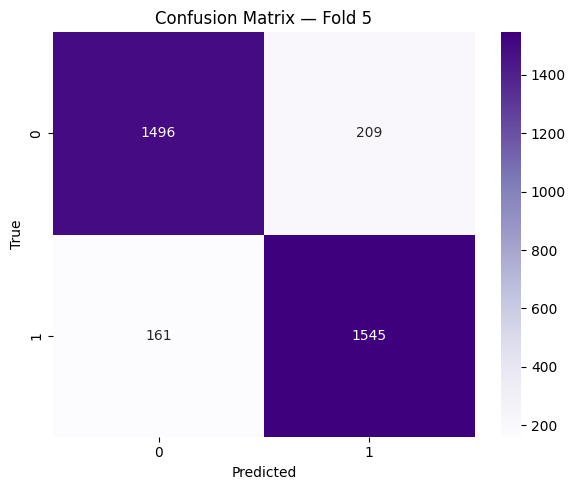

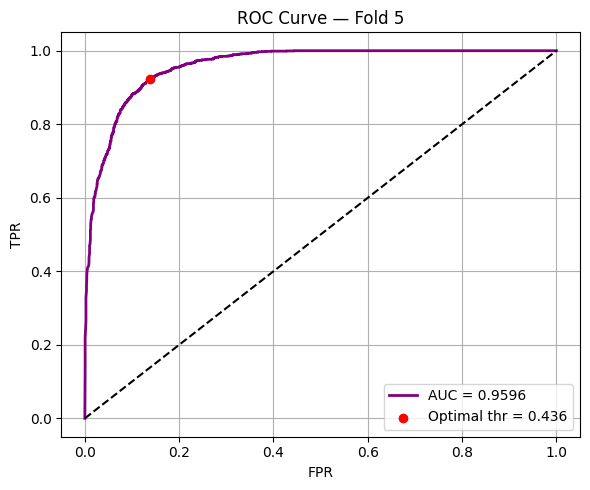

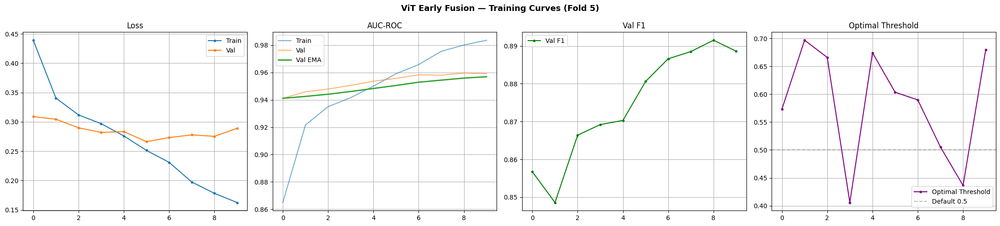

In [3]:
# ============================================================
# CELL 3 — Visualizations
# ============================================================

# 1 — Confusion Matrix
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=[str(c) for c in classes],
            yticklabels=[str(c) for c in classes], ax=ax)
ax.set_ylabel("True"); ax.set_xlabel("Predicted")
ax.set_title(f"Confusion Matrix — Fold {best_fold+1}")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f"confusion_matrix_fold{best_fold+1}.png"), dpi=150)
plt.show()

# 2 — ROC Curve
fpr, tpr, thresholds = roc_curve(trues, probs)
youden_idx = np.argmax(tpr - fpr)
opt_thr    = thresholds[youden_idx]

fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(fpr, tpr, lw=2, color="purple", label=f"AUC = {auc:.4f}")
ax.scatter(fpr[youden_idx], tpr[youden_idx], color="red", zorder=5,
           label=f"Optimal thr = {opt_thr:.3f}")
ax.plot([0, 1], [0, 1], "k--")
ax.set_xlabel("FPR"); ax.set_ylabel("TPR")
ax.set_title(f"ROC Curve — Fold {best_fold+1}")
ax.legend(); ax.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f"roc_curve_fold{best_fold+1}.png"), dpi=150)
plt.show()

# 3 — Training Curves
history = all_histories[f"fold_{best_fold+1}"]
fig, axes = plt.subplots(1, 4, figsize=(22, 5))

axes[0].plot(history["train_loss"], label="Train", marker="o", ms=3)
axes[0].plot(history["val_loss"],   label="Val",   marker="o", ms=3)
axes[0].set_title("Loss"); axes[0].legend(); axes[0].grid(True)

axes[1].plot(history["train_auc"],   label="Train",   alpha=0.6)
axes[1].plot(history["val_auc"],     label="Val",     alpha=0.6)
axes[1].plot(history["val_auc_ema"], label="Val EMA", lw=2)
axes[1].set_title("AUC-ROC"); axes[1].legend(); axes[1].grid(True)

axes[2].plot(history["val_f1"], label="Val F1", color="green", marker="o", ms=3)
axes[2].set_title("Val F1"); axes[2].legend(); axes[2].grid(True)

axes[3].plot(history["threshold"], label="Optimal Threshold", color="purple", marker="o", ms=3)
axes[3].axhline(0.5, color="gray", linestyle="--", alpha=0.5, label="Default 0.5")
axes[3].set_title("Optimal Threshold"); axes[3].legend(); axes[3].grid(True)

plt.suptitle(f"ViT Early Fusion — Training Curves (Fold {best_fold+1})",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f"training_curves_fold{best_fold+1}.png"), dpi=150)
plt.show()



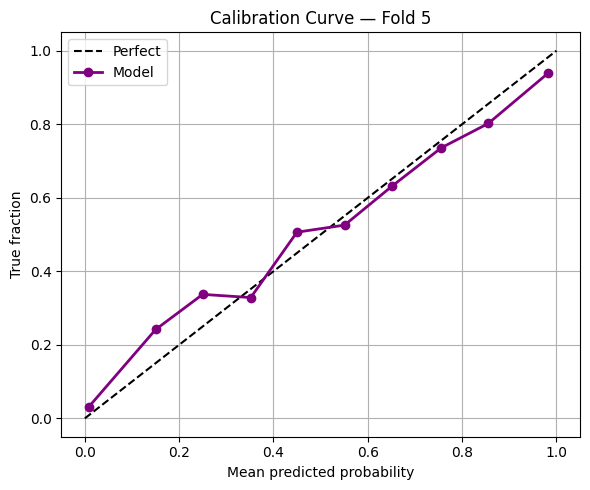


✅ All visualizations saved to: /kaggle/working/vit_early_fusion_outputs


In [4]:
# 4 — Calibration Curve
import numpy as np

probs_arr = np.array(probs)
trues_arr = np.array(trues)

n_bins = 10
bins   = np.linspace(0, 1, n_bins + 1)
centers, fracs = [], []

for i in range(n_bins):
    mask = (probs_arr >= bins[i]) & (probs_arr < bins[i+1])
    if mask.sum() > 0:
        centers.append(probs_arr[mask].mean())
        fracs.append(trues_arr[mask].mean())

fig, ax = plt.subplots(figsize=(6, 5))
ax.plot([0, 1], [0, 1], "k--", label="Perfect")
ax.plot(centers, fracs, marker="o", lw=2, color="purple", label="Model")
ax.set_xlabel("Mean predicted probability")
ax.set_ylabel("True fraction")
ax.set_title(f"Calibration Curve — Fold {best_fold+1}")
ax.legend(); ax.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f"calibration_fold{best_fold+1}.png"), dpi=150)
plt.show()
print(f"\n✅ All visualizations saved to: {OUTPUT_DIR}")

Running KernelExplainer (~1-2 min)...


  0%|          | 0/30 [00:00<?, ?it/s]

✅ SHAP values computed
shap_mel shape  : (30, 29)
test_meta shape : (30, 29)


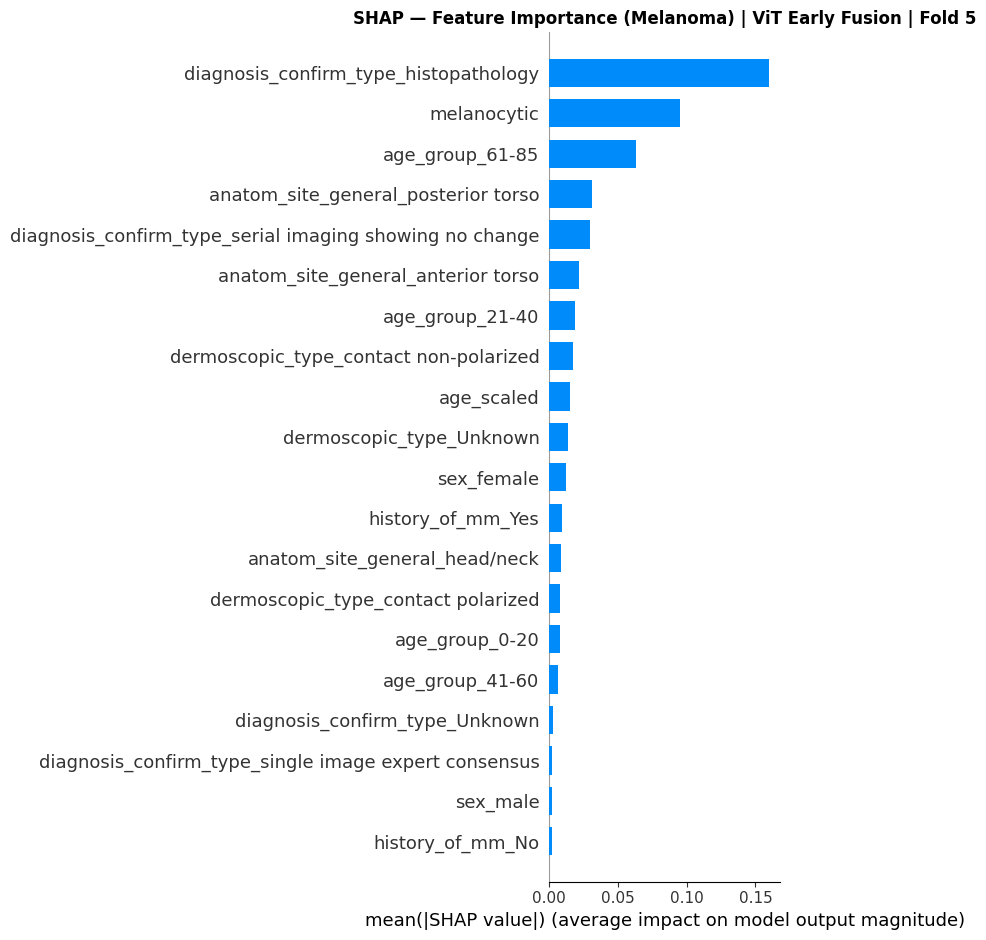

Saved: /kaggle/working/vit_early_fusion_outputs/shap_bar_fold5.png


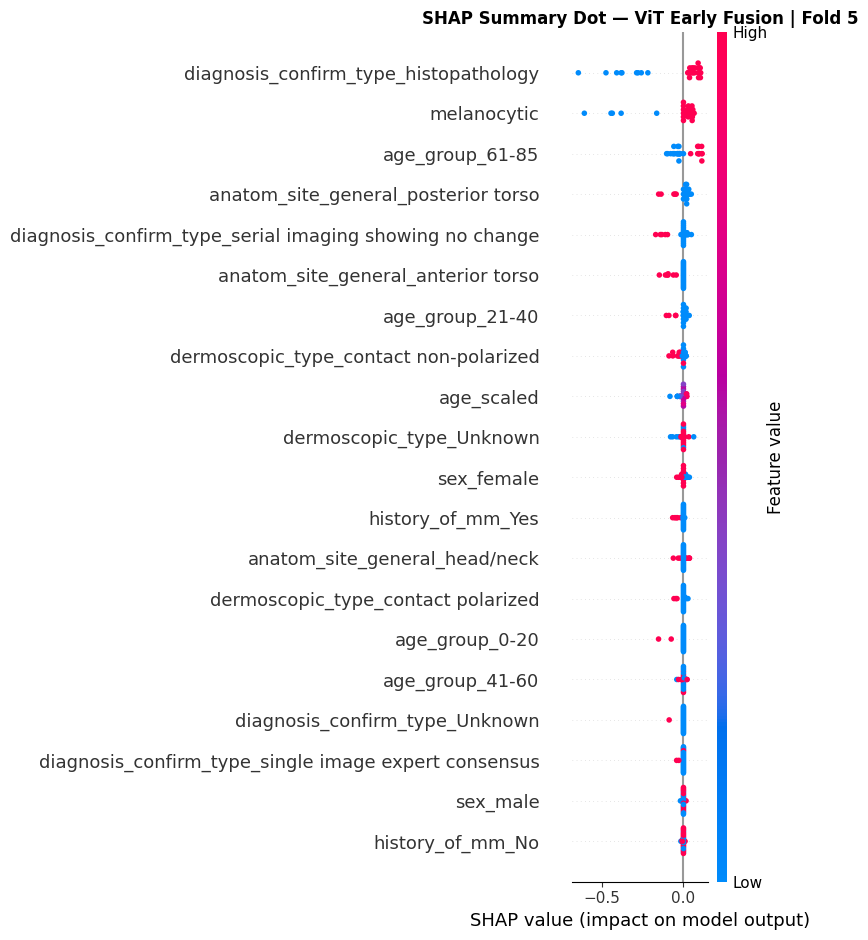

Saved: /kaggle/working/vit_early_fusion_outputs/shap_dot_fold5.png


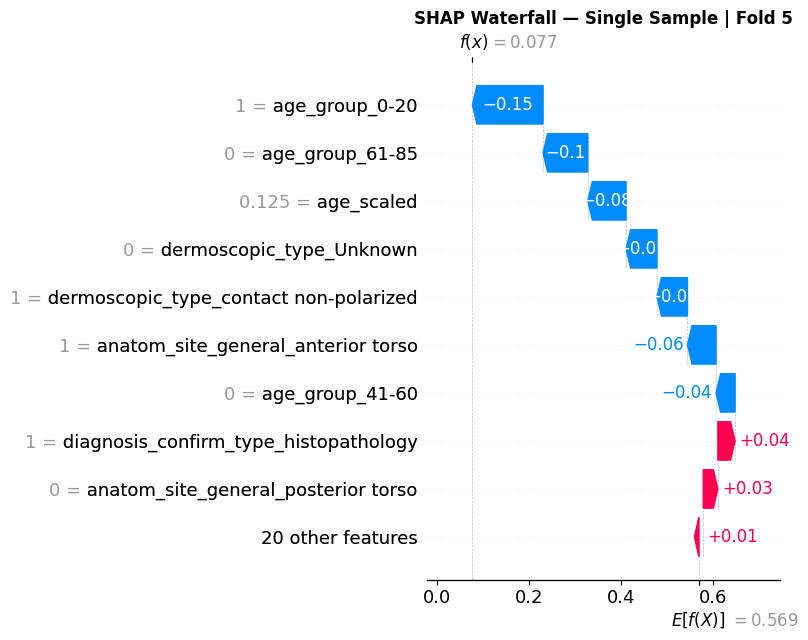

Saved: /kaggle/working/vit_early_fusion_outputs/shap_waterfall_fold5.png

Top 5 most important metadata features — ViT Early Fusion:
  1. diagnosis_confirm_type_histopathology         SHAP = 0.1599
  2. melanocytic                                   SHAP = 0.0953
  3. age_group_61-85                               SHAP = 0.0632
  4. anatom_site_general_posterior torso           SHAP = 0.0312
  5. diagnosis_confirm_type_serial imaging showing no change SHAP = 0.0297

✅ All SHAP plots saved to: /kaggle/working/vit_early_fusion_outputs


In [5]:
import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

# ============================================================
# LOAD BEST MODEL
# ============================================================
best_fold  = int(np.argmax(fold_results))
model_shap = ViTEarlyFusion(META_DIM, NUM_CLASSES).to(device)
model_shap.load_state_dict(
    torch.load(os.path.join(OUTPUT_DIR, f"best_fold_{best_fold}.pth")))
model_shap.cpu()
model_shap.eval()

# ============================================================
# VAL DATA
# ============================================================
_, va      = list(skf.split(df, df["label"]))[best_fold]
val_subset = df.iloc[va].reset_index(drop=True)

N_SHAP    = 100
sample_df = val_subset.sample(n=N_SHAP, random_state=SEED).reset_index(drop=True)

# ============================================================
# PREDICTOR FUNCTION
# ============================================================
def predict_proba(meta_numpy: np.ndarray) -> np.ndarray:
    with torch.no_grad():
        meta_t    = torch.tensor(meta_numpy, dtype=torch.float32)
        dummy_img = torch.zeros(meta_t.shape[0], 3, IMG_SIZE, IMG_SIZE)
        logits    = model_shap(dummy_img, meta_t)
        probs     = torch.softmax(logits, dim=1).numpy()
    return probs

# ============================================================
# BACKGROUND + TEST DATA
# ============================================================
background_np = sample_df[META_COLS].sample(
    min(100, len(sample_df)), random_state=SEED
).values.astype(np.float32)
background_summary = shap.kmeans(background_np, 10)

test_meta_np = sample_df[META_COLS].sample(
    30, random_state=SEED
).values.astype(np.float32)

# ============================================================
# RUN SHAP
# ============================================================
print("Running KernelExplainer (~1-2 min)...")
explainer   = shap.KernelExplainer(predict_proba, background_summary)
shap_values = explainer.shap_values(test_meta_np, nsamples=150)
print("✅ SHAP values computed")

# ── fix shape ─────────────────────────────────────────────
if isinstance(shap_values, list):
    shap_mel = np.array(shap_values[1])
else:
    sv_arr = np.array(shap_values)
    if sv_arr.ndim == 3:
        shap_mel = sv_arr[:, :, 1]
    else:
        shap_mel = sv_arr

# ── expected_value ─────────────────────────────────────────
ev = explainer.expected_value
if isinstance(ev, (list, np.ndarray)):
    base_val = float(np.array(ev).flat[1])
else:
    base_val = float(ev)

print(f"shap_mel shape  : {shap_mel.shape}")
print(f"test_meta shape : {test_meta_np.shape}")

# ============================================================
# PLOT 1 — Bar
# ============================================================
plt.figure(figsize=(10, 5))
shap.summary_plot(
    shap_mel, test_meta_np,
    feature_names=META_COLS,
    plot_type="bar", show=False
)
plt.title(f"SHAP — Feature Importance (Melanoma) | ViT Early Fusion | Fold {best_fold+1}",
          fontweight="bold")
plt.tight_layout()
path1 = os.path.join(OUTPUT_DIR, f"shap_bar_fold{best_fold+1}.png")
plt.savefig(path1, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {path1}")

# ============================================================
# PLOT 2 — Dot (Beeswarm)
# ============================================================
plt.figure(figsize=(10, 5))
shap.summary_plot(
    shap_mel, test_meta_np,
    feature_names=META_COLS, show=False
)
plt.title(f"SHAP Summary Dot — ViT Early Fusion | Fold {best_fold+1}",
          fontweight="bold")
plt.tight_layout()
path2 = os.path.join(OUTPUT_DIR, f"shap_dot_fold{best_fold+1}.png")
plt.savefig(path2, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {path2}")

# ============================================================
# PLOT 3 — Waterfall (single sample)
# ============================================================
explanation = shap.Explanation(
    values        = shap_mel[0],
    base_values   = base_val,
    data          = test_meta_np[0],
    feature_names = META_COLS
)

try:
    plt.figure(figsize=(10, 5))
    shap.plots.waterfall(explanation, show=False)
except Exception:
    plt.figure(figsize=(10, 5))
    shap.waterfall_plot(explanation)

plt.title(f"SHAP Waterfall — Single Sample | Fold {best_fold+1}",
          fontweight="bold")
plt.tight_layout()
path3 = os.path.join(OUTPUT_DIR, f"shap_waterfall_fold{best_fold+1}.png")
plt.savefig(path3, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {path3}")

# ============================================================
# TOP 5 FEATURES
# ============================================================
mean_shap  = np.abs(shap_mel).mean(axis=0)
sorted_idx = np.argsort(mean_shap)[::-1]

print(f"\nTop 5 most important metadata features — ViT Early Fusion:")
for rank, i in enumerate(sorted_idx[:5], 1):
    print(f"  {rank}. {META_COLS[i]:45s} SHAP = {mean_shap[i]:.4f}")

# ── move model back to device ─────────────────────────────
model_shap.to(device)
print(f"\n✅ All SHAP plots saved to: {OUTPUT_DIR}")


  SHAP FOR ViT EARLY FUSION - 100 SAMPLES
Using Best Fold: 5
✅ Early Fusion Model weights loaded.
Starting SHAP for Early Fusion... (Processing 100 samples)


  0%|          | 0/100 [00:00<?, ?it/s]

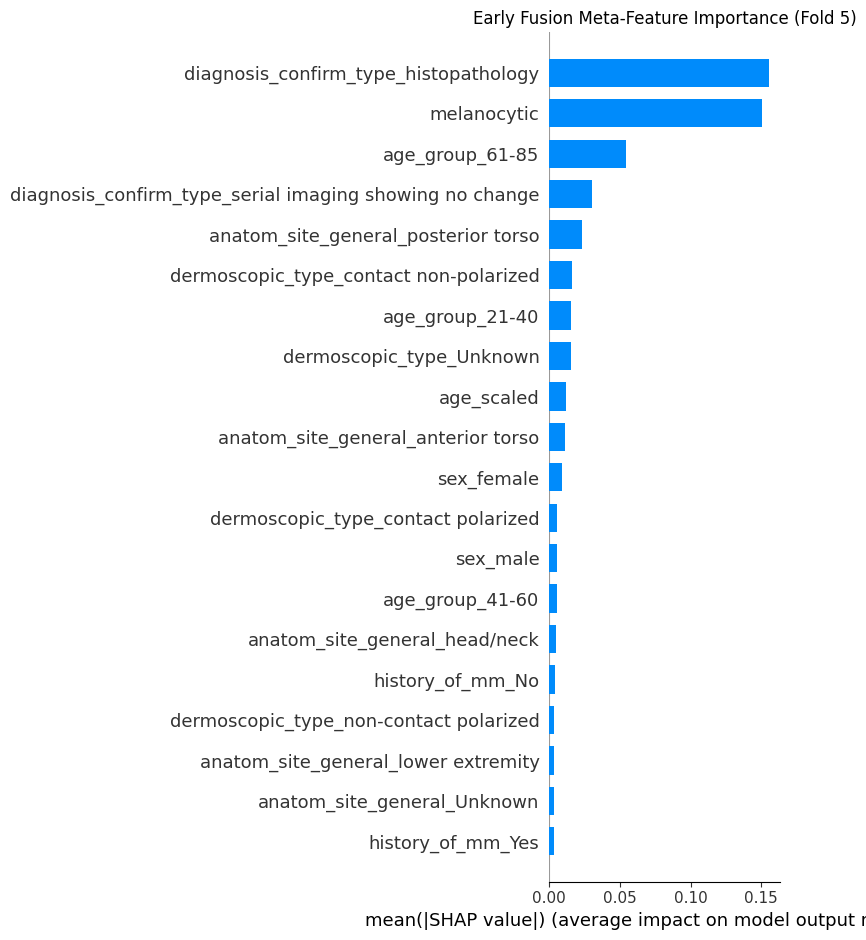

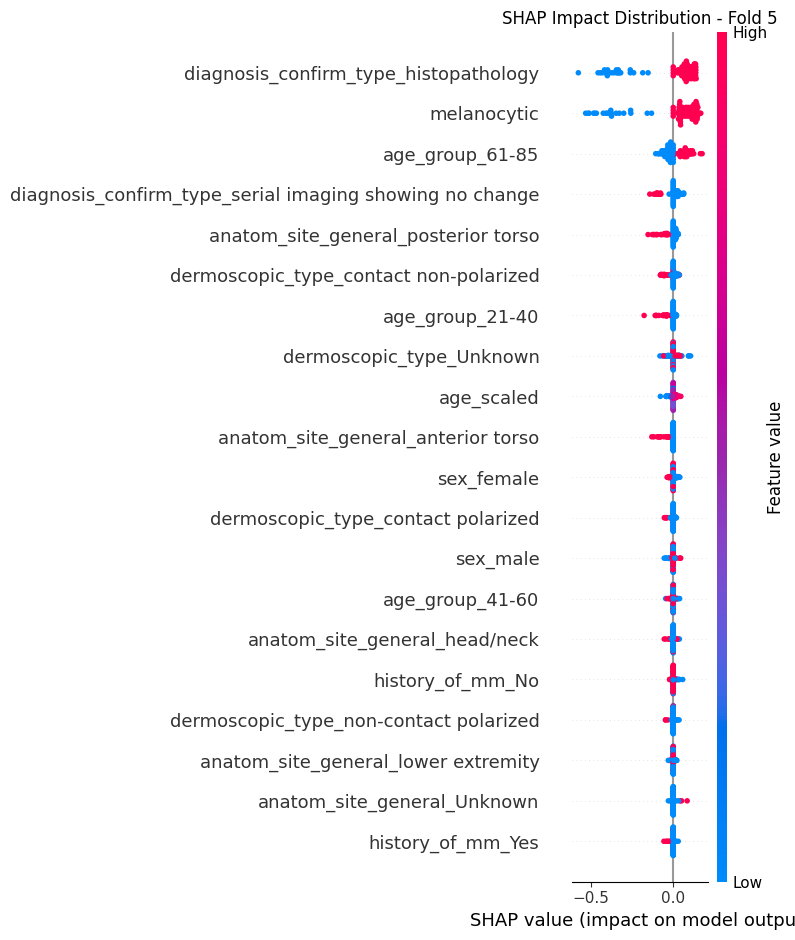

✅ SHAP Analysis for Early Fusion complete! Results saved in /kaggle/working/vit_early_fusion_outputs


In [6]:
import shap
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# ============================================================
# 1. LOAD BEST MODEL (Early Fusion Version)
# ============================================================
print("\n" + "="*50)
print("  SHAP FOR ViT EARLY FUSION - 100 SAMPLES")
print("="*50)


best_fold_idx = int(np.argmax(fold_results))
print(f"Using Best Fold: {best_fold_idx + 1}")


model_shap = ViTEarlyFusion(META_DIM, NUM_CLASSES).to(device)
model_path = os.path.join(OUTPUT_DIR, f"best_fold_{best_fold_idx}.pth")

if os.path.exists(model_path):
    model_shap.load_state_dict(torch.load(model_path, map_location=device))
    print(f"✅ Early Fusion Model weights loaded.")
else:
    print(f"⚠️ Error: Model file not found at {model_path}!")

model_shap.eval()

# ============================================================
# 2. DATA PREPARATION
# ============================================================

_, va_idx = list(skf.split(df, df["label"]))[best_fold_idx]
val_subset = df.iloc[va_idx].reset_index(drop=True)

N_SHAP_TOTAL = 100 
sample_df = val_subset.sample(n=min(len(val_subset), N_SHAP_TOTAL), random_state=SEED).reset_index(drop=True)

test_meta_np = sample_df[META_COLS].values.astype(np.float32)


background_summary = shap.kmeans(test_meta_np, 15) 

# ============================================================
# 3. PREDICTOR FUNCTION (Custom for Early Fusion)
# ============================================================
def predict_proba_early_fusion(meta_numpy: np.ndarray) -> np.ndarray:
    model_shap.eval()
    dataset_size = meta_numpy.shape[0]
    all_probs = []
    
  
    meta_t = torch.tensor(meta_numpy, dtype=torch.float32).to(device)
    
   
    batch_size = 64 
    
    with torch.no_grad():
        for i in range(0, dataset_size, batch_size):
            batch_meta = meta_t[i : i + batch_size]
            curr_batch_len = batch_meta.shape[0]
            
   
            dummy_img = torch.zeros(curr_batch_len, 3, IMG_SIZE, IMG_SIZE).to(device)
            
            with torch.cuda.amp.autocast():
                logits = model_shap(dummy_img, batch_meta)
                probs = torch.softmax(logits, dim=1).cpu().numpy()
            
            all_probs.append(probs)
            
    return np.concatenate(all_probs, axis=0)

# ============================================================
# 4. RUN SHAP
# ============================================================
print(f"Starting SHAP for Early Fusion... (Processing {len(test_meta_np)} samples)")
explainer = shap.KernelExplainer(predict_proba_early_fusion, background_summary)


shap_values = explainer.shap_values(test_meta_np, nsamples=100)


if isinstance(shap_values, list):
   
    shap_to_plot = shap_values[1]
else:
    shap_to_plot = shap_values[:, :, 1] if shap_values.ndim == 3 else shap_values

# ============================================================
# 5. VISUALIZATION
# ============================================================
# 1. Bar Plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_to_plot, test_meta_np, feature_names=META_COLS, plot_type="bar", show=False)
plt.title(f"Early Fusion Meta-Feature Importance (Fold {best_fold_idx+1})")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "early_fusion_shap_bar.png"))
plt.show()

# 2. Beeswarm Plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_to_plot, test_meta_np, feature_names=META_COLS, show=False)
plt.title(f"SHAP Impact Distribution - Fold {best_fold_idx+1}")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "early_fusion_shap_beeswarm.png"))
plt.show()

print(f"✅ SHAP Analysis for Early Fusion complete! Results saved in {OUTPUT_DIR}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 56.2 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
🚀 Generating Comparison Grid for 10 samples using ViT Early Fusion...


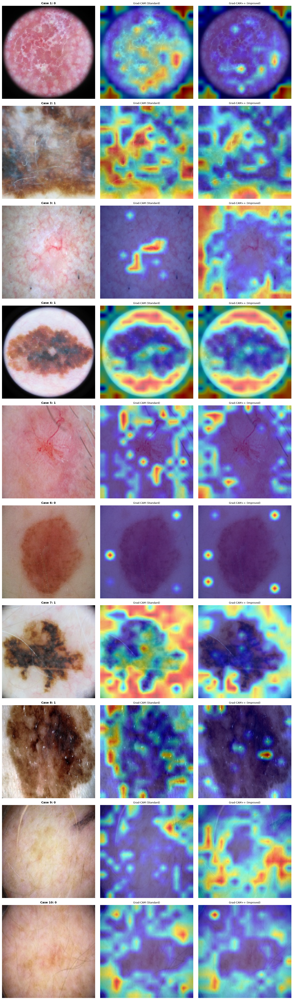

✅ Finished! Visualization saved to: /kaggle/working/vit_early_fusion_outputs/early_fusion_comparison_10_samples.png


In [7]:
# ============================================================
# CELL 6 — FINAL: COMPARISON GRID (10 SAMPLES) - ViT EARLY FUSION
# ============================================================

try:
    import pytorch_grad_cam
except ImportError:
    !pip install grad-cam -q

import cv2
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import os
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# ------------------------------------------------------------
# 1.(Reshape & Wrapper)
# ------------------------------------------------------------

def reshape_transform(tensor, height=14, width=14):

    result = tensor[:, 1:197, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

class HybridWrapper(nn.Module):

    def __init__(self, model, meta):
        super().__init__()
        self.model = model
        self.meta = meta
    def forward(self, x):
        return self.model(x, self.meta)


model_shap.eval()


target_layers = [model_shap.vit.blocks[-1].norm1] 



n_samples = 10  
indices = np.random.choice(len(val_subset), n_samples, replace=False)

fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

print(f"🚀 Generating Comparison Grid for {n_samples} samples using ViT Early Fusion...")

for i, idx in enumerate(indices):
    row = val_subset.iloc[idx]
    
  
    img_path = os.path.join(IMG_FOLDER, row["image_fixed"])
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: 
        print(f"⚠️ Image not found: {img_path}")
        continue
    
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
    

    img_tensor = val_tfms(image=img_resized)["image"].unsqueeze(0).to(device)
    meta_tensor = torch.tensor(row[META_COLS].values.astype(np.float32)).unsqueeze(0).to(device)
    

    wrapped_model = HybridWrapper(model_shap, meta_tensor)
    targets = [ClassifierOutputTarget(row["label"])]
    
    cam_args = {
        "model": wrapped_model,
        "target_layers": target_layers,
        "reshape_transform": reshape_transform
    }


    with GradCAM(**cam_args) as cam:
        mask = cam(input_tensor=img_tensor, targets=targets)[0, :]
        res_std = show_cam_on_image(img_resized.astype(np.float32)/255, mask, use_rgb=True)
        
 
    with GradCAMPlusPlus(**cam_args) as cam_pp:
        mask_pp = cam_pp(input_tensor=img_tensor, targets=targets)[0, :]
        res_plus = show_cam_on_image(img_resized.astype(np.float32)/255, mask_pp, use_rgb=True)

  
    axes[i, 0].imshow(img_resized)
    axes[i, 0].set_title(f"Case {i+1}: {row[TARGET_COL]}", fontsize=10, fontweight="bold")
    axes[i, 0].axis('off')
    
    # الـ Grad-CAM
    axes[i, 1].imshow(res_std)
    axes[i, 1].set_title("Grad-CAM (Standard)", fontsize=9)
    axes[i, 1].axis('off')
    
    # الـ Grad-CAM++
    axes[i, 2].imshow(res_plus)
    axes[i, 2].set_title("Grad-CAM++ (Improved)", fontsize=9)
    axes[i, 2].axis('off')

plt.tight_layout()

save_path = os.path.join(OUTPUT_DIR, "early_fusion_comparison_10_samples.png")
plt.savefig(save_path, dpi=150)
plt.show()

print(f"✅ Finished! Visualization saved to: {save_path}")